## Lab2

### 0. Importing the necessary libraries

In [1]:
from math import pi
import numpy as np
import roboticstoolbox as rtb
import matplotlib.pyplot as plt
import spatialmath.base as sb

### 1. Importing the Puma 560 model

In [2]:
robot = rtb.models.DH.Puma560()
print(robot)

DHRobot: Puma 560 (by Unimation), 6 joints (RRRRRR), dynamics, geometry, standard DH parameters
┌─────┬────────┬────────┬────────┬─────────┬────────┐
│ θⱼ  │   dⱼ   │   aⱼ   │   ⍺ⱼ   │   q⁻    │   q⁺   │
├─────┼────────┼────────┼────────┼─────────┼────────┤
│  q1 │ 0.6718 │      0 │  90.0° │ -160.0° │ 160.0° │
│  q2 │      0 │ 0.4318 │   0.0° │ -110.0° │ 110.0° │
│  q3 │   0.15 │ 0.0203 │ -90.0° │ -135.0° │ 135.0° │
│  q4 │ 0.4318 │      0 │  90.0° │ -266.0° │ 266.0° │
│  q5 │      0 │      0 │ -90.0° │ -100.0° │ 100.0° │
│  q6 │      0 │      0 │   0.0° │ -266.0° │ 266.0° │
└─────┴────────┴────────┴────────┴─────────┴────────┘

┌──┬──┐
└──┴──┘

┌──────┬─────┬──────┬───────┬─────┬──────┬─────┐
│ name │ q0  │ q1   │ q2    │ q3  │ q4   │ q5  │
├──────┼─────┼──────┼───────┼─────┼──────┼─────┤
│   qr │  0° │  90° │ -90°  │  0° │  0°  │  0° │
│   qz │  0° │  0°  │  0°   │  0° │  0°  │  0° │
│   qn │  0° │  45° │  180° │  0° │  45° │  0° │
│   qs │  0° │  0°  │ -90°  │  0° │  0°  │  0° │
└──

### 2. Set the initial position of the robot

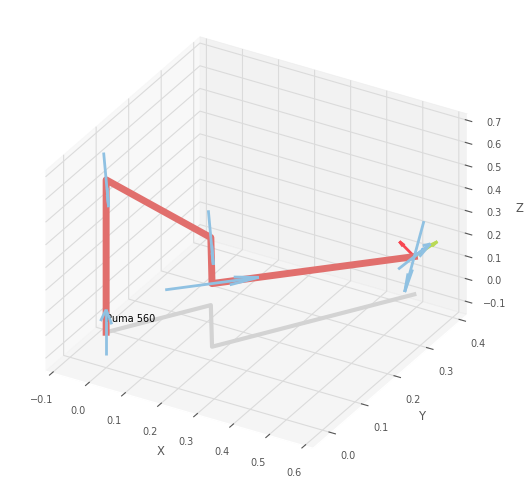

<Figure size 640x480 with 0 Axes>

In [3]:
q_start = [pi/4, -pi/3, -pi/4, pi/3, -pi/3, pi/4]
robot.plot(q_start)
plt.show()

### 3. Solve the Forward kinematics problem

In [4]:
T_start = robot.fkine(q_start)
print(T_start)

  -0.805     0.5292   -0.2681    0.55      
   0.128     0.5962    0.7926    0.3378    
   0.5792    0.6038   -0.5477    0.1665    
   0         0         0         1         



### 6. Build a working area of the manipulator

Initializing variables

In [5]:
n = 20  # Number of points on each axis
i = 0  
move = [np.linspace(robot.links[i].qlim[0], robot.links[i].qlim[1], n) for i in range(3)]  # We write down the movement limits for the first three links
pose = np.zeros([3,n**3])  # Creating an empty array for writing data

Calculating the working area

In [6]:
# We're going through each point.
for q1 in move[0]:
    for q2 in move[1]:
        for q3 in move[2]:
            Tt = robot.fkine([q1,q2,q3,0,0,0])  # We solve the MPC by changing only the first 3 generalized coordinates
            for j in range(3):
                pose[j][i] = Tt.t[j]  # Saving a point
            i += 1

Building a work area

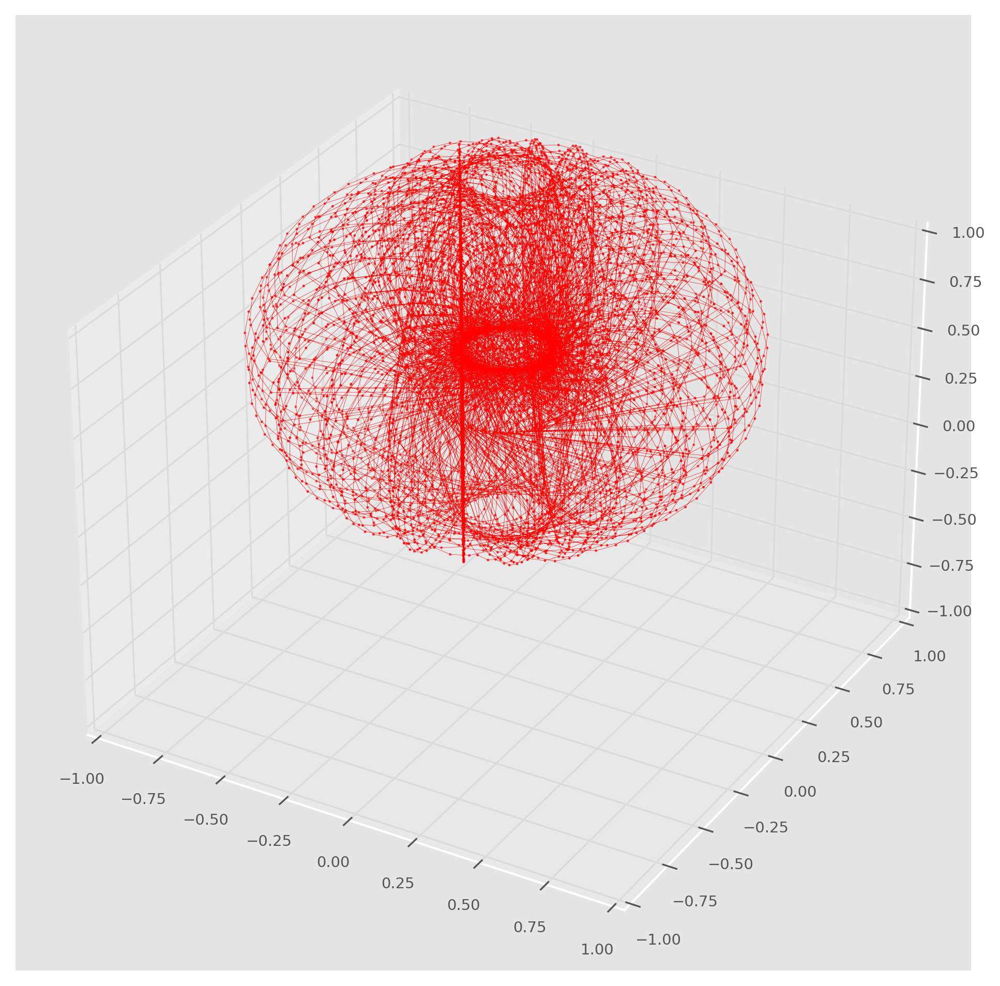

In [9]:
plt.figure(figsize=(8,8), dpi=300)
ax = plt.axes(projection="3d")
ax.plot3D(pose[0], pose[1], pose[2], color='red', linewidth=0.15)
ax.scatter3D(pose[0], pose[1], pose[2], s=0.5, color='red')
ax.set_xlim(-1,1)
ax.set_ylim(-1,1)
ax.set_zlim(-1,1)
plt.show()

### 7. Choose an endpoint and check it (solve the inverse kinematics problem)

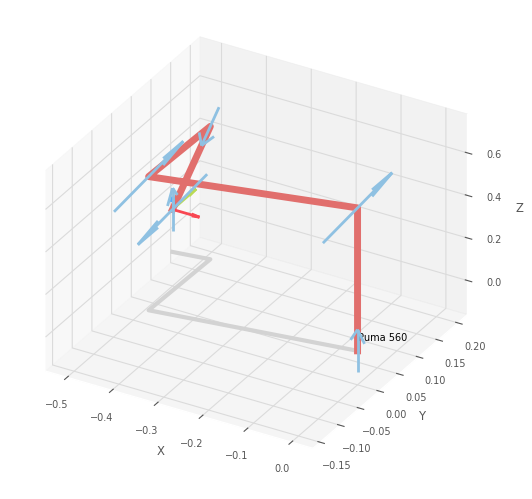

<Figure size 640x480 with 0 Axes>

In [10]:
point = [-0.5,0.1,0.2]
T_end = sb.transl(point)
q_end = robot.ikine_GN(T_end).q  # There are other methods besides ikine_GN
robot.plot(q_end)
plt.show()

### 8. Plan the trajectory

Plan the trajectory using the 'jtraj' method for $N$ = 100 points

In [11]:
N = 100
t_start = 0
t_stop = 5
t_shag = t_stop/N
time = np.arange(t_start, t_stop, t_shag)

tr_jtraj = rtb.jtraj(q_start, q_end, time)

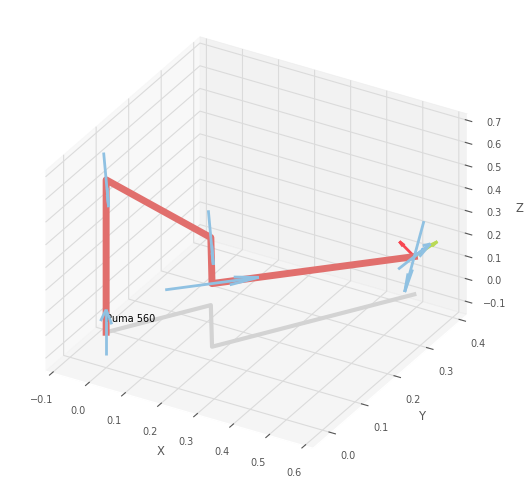

PyPlot3D backend, t = 4.99999999999999, scene:
  robot: Text(0.0, 0.0, 'Puma 560')

<Figure size 640x480 with 0 Axes>

In [18]:
robot.plot(tr_jtraj.q, backend='pyplot', movie='puma_jtraj.gif')

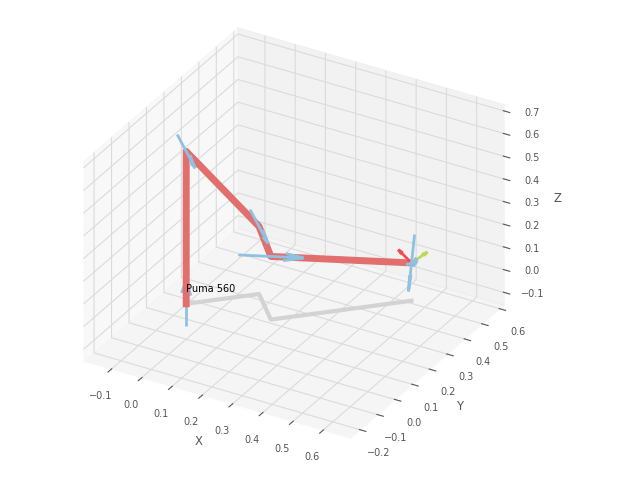

In [19]:
from IPython.display import Image
Image(filename='puma_jtraj.gif')

Plan the same trajectory using the 'mt rj' method with the 'trapezoidal' function

In [12]:
tr_trap = rtb.mtraj(rtb.trapezoidal, q_start, q_end, time)

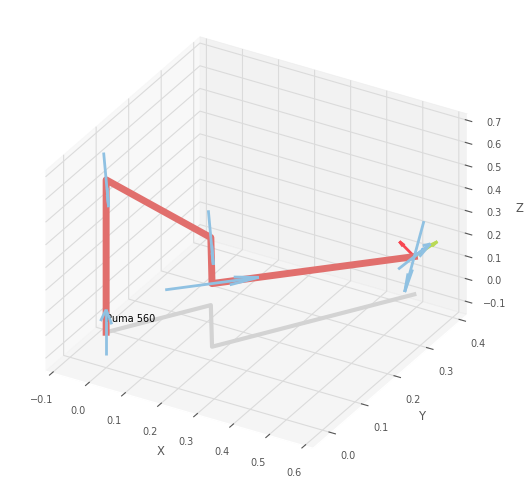

PyPlot3D backend, t = 4.99999999999999, scene:
  robot: Text(0.0, 0.0, 'Puma 560')

<Figure size 640x480 with 0 Axes>

In [20]:
robot.plot(tr_trap.q, backend='pyplot', movie='puma_trap.gif')

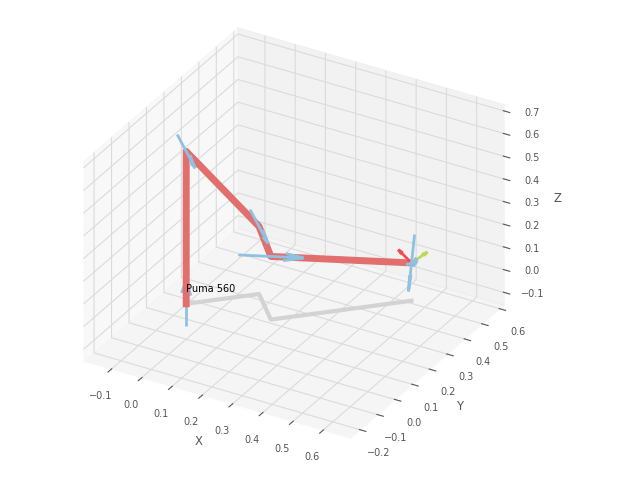

In [21]:
from IPython.display import Image
Image(filename='puma_trap.gif')

Plan the same trajectory using the 'mtrj' method with the 'quantic' function

In [13]:
tr_quin = rtb.mtraj(rtb.quintic, q_start, q_end, time)

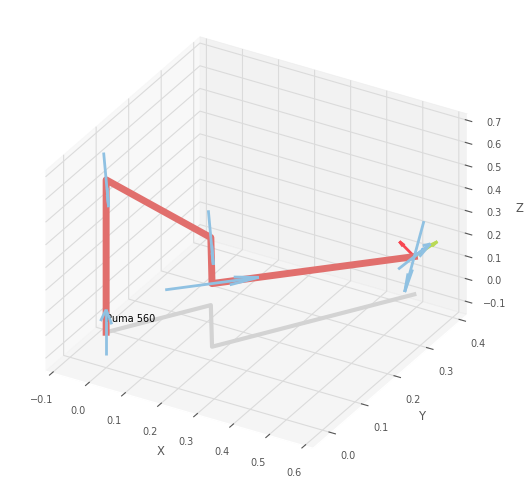

PyPlot3D backend, t = 4.99999999999999, scene:
  robot: Text(0.0, 0.0, 'Puma 560')

<Figure size 640x480 with 0 Axes>

In [22]:
robot.plot(tr_quin.q, backend='pyplot', movie='puma_quin.gif')

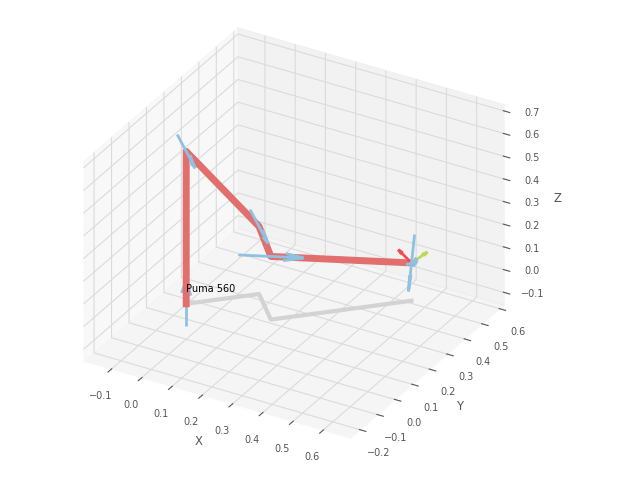

In [23]:
from IPython.display import Image
Image(filename='puma_quin.gif')

### 9. Plot the graphs

Plot the position graphs for each link

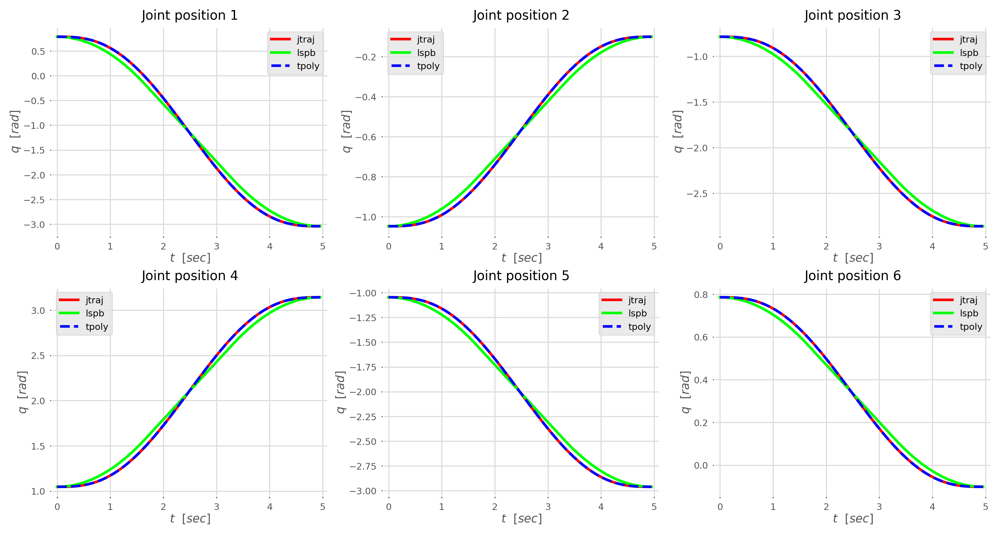

In [27]:
plt.figure(figsize=(10,5), dpi=300)
for g in range(1,7):
    plt.subplot(2,3,g)
    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0.2, hspace=0.25)  
    traj_pos_jtraj = [tr_jtraj.q[i][g-1] for i in range(len(tr_jtraj.q))] 
    traj_pos_trap = [tr_trap.q[i][g-1] for i in range(len(tr_trap.q))]  
    traj_pos_quin = [tr_quin.q[i][g-1] for i in range(len(tr_quin.q))]  
    plt.plot(time, traj_pos_jtraj, linestyle='-', linewidth=2, color=(1,0,0), label=r"jtraj") 
    plt.plot(time, traj_pos_trap, linestyle='-', linewidth=2, color=(0,1,0), label=r"lspb") 
    plt.plot(time, traj_pos_quin, linestyle='--', linewidth=2, color=(0,0,1), label=r"tpoly")  
    plt.title(r"Joint position {}".format(g), fontsize=10) 
    plt.ylabel(r"$q$  [$rad$]", fontsize=9)  
    plt.xlabel(r"$t$  [$sec$]", fontsize=9)
    plt.grid(True)  
    plt.legend()  
    ax = plt.gca()  
    ax.set_facecolor((1,1,1)) 
    ax.set_xlim([t_start-0.1,t_stop+0.1]) 
plt.show()

Plot the velocity graphs for each link

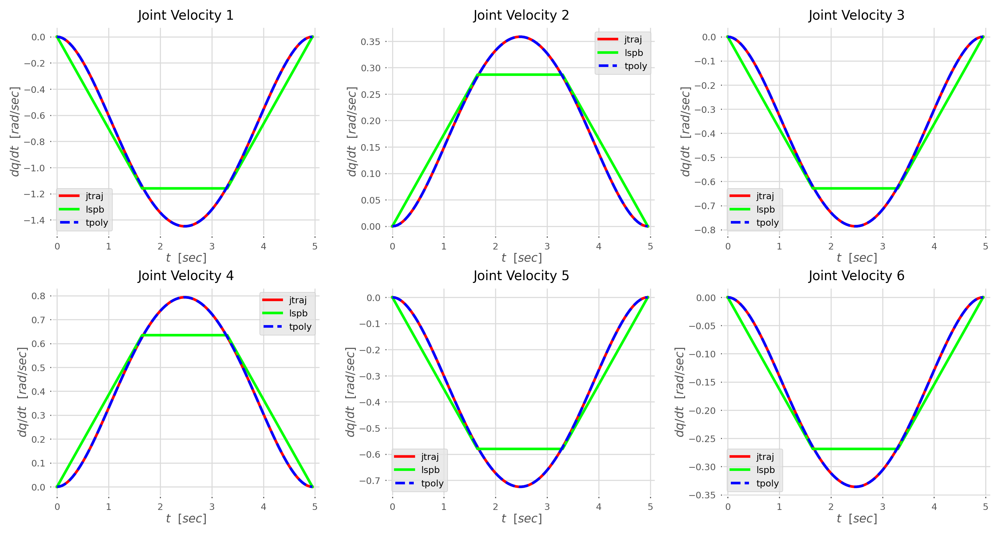

In [26]:
plt.figure(figsize=(10,5), dpi=300)  
for g in range(1,7):
    plt.subplot(2,3,g)
    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0.25, hspace=0.25) 
    traj_vel_jtraj = [tr_jtraj.qd[i][g-1] for i in range(len(tr_jtraj.qd))] 
    traj_vel_trap = [tr_trap.qd[i][g-1] for i in range(len(tr_trap.qd))]  
    traj_vel_quin = [tr_quin.qd[i][g-1] for i in range(len(tr_quin.qd))] 
    plt.plot(time, traj_vel_jtraj, linestyle='-', linewidth=2, color=(1,0,0), label=r"jtraj")
    plt.plot(time, traj_vel_trap, linestyle='-', linewidth=2, color=(0,1,0), label=r"lspb") 
    plt.plot(time, traj_vel_quin, linestyle='--', linewidth=2, color=(0,0,1), label=r"tpoly")  
    plt.title(r"Joint Velocity {}".format(g), fontsize=10)  
    plt.ylabel(r"$dq/dt$  [$rad/sec$]", fontsize=9) 
    plt.xlabel(r"$t$  [$sec$]", fontsize=9)
    plt.grid(True) 
    plt.legend()  
    ax = plt.gca() 
    ax.set_facecolor((1,1,1))
    ax.set_xlim([t_start-0.1,t_stop+0.1]) 
plt.show()

Plot the acceleration graphs for each link

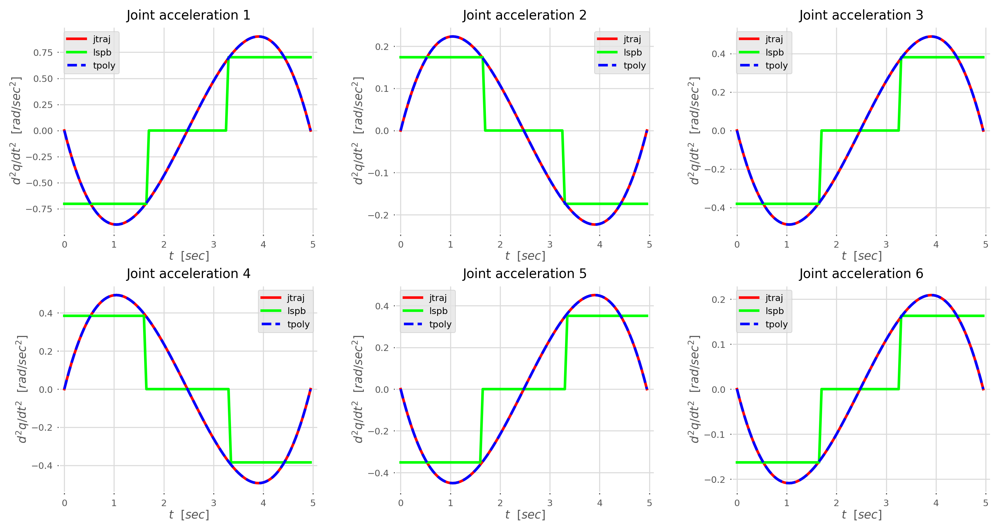

In [25]:
fig = plt.figure(figsize=(10,5), dpi=300) 
for g in range(1,7):
    plt.subplot(2,3,g)
    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0.3, hspace=0.25) 
    traj_accel_jtraj = [tr_jtraj.qdd[i][g-1] for i in range(len(tr_jtraj.qdd))]  
    traj_accel_trap = [tr_trap.qdd[i][g-1] for i in range(len(tr_trap.qdd))]
    traj_accel_quin = [tr_quin.qdd[i][g-1] for i in range(len(tr_quin.qdd))]  
    plt.plot(time, traj_accel_jtraj, linestyle='-', linewidth=2, color=(1,0,0), label=r"jtraj")  
    plt.plot(time, traj_accel_trap, linestyle='-', linewidth=2, color=(0,1,0), label=r"lspb")  
    plt.plot(time, traj_accel_quin, linestyle='--', linewidth=2, color=(0,0,1), label=r"tpoly")  
    plt.title(r"Joint acceleration {}".format(g), fontsize=10)  
    plt.ylabel(r"${d^2}q/d{t^2}$  [$rad/{sec}^2$]", fontsize=9)  
    plt.xlabel(r"$t$  [$sec$]", fontsize=9) 
    plt.grid(True)
    plt.legend() 
    ax = plt.gca()  
    ax.set_facecolor((1,1,1)) 
    ax.set_xlim([t_start-0.1,t_stop+0.1]) 
plt.show()

## Conclusions

### Joint Position Plots:
All three methods, namely **jtraj**, **lspb**, and **tpoly** start and end at the same positions. This shows that position boundary conditions are satisfied for all joints and methods, which is essential in point-to-point trajectory planning.

### Joint Velocity Plots:
#### jtraj:
- Produces smooth and continuous velocity curves for all joints.
- Captures both acceleration and deceleration phases smoothly.
- Matches closely with **tpoly**, showing high similarity in performance.

#### tpoly:
- It also generates smooth velocity profiles with continuous derivatives.
- Closely follows the **jtraj** trajectory, indicating that it is also suitable for applications requiring smooth motion.

#### lspb:
- It is characterized by sharp transitions into and out of constant velocity phases.
- The flat middle segments indicate uniform motion, which can be beneficial for minimizing actuator effort during that phase but introduces discontinuities in acceleration. These discontinuities may cause higher mechanical stress or require more robust control strategies to handle abrupt changes.

### Joint Accelerations Plots:
#### jtraj:
- This method shows smooth sinusoidal acceleration profiles.
- Acceleration changes gradually, indicating a continuous second derivative, which is ideal for robot motion as it reduces mechanical stress.

#### lspb (Trapezoidal):
- Acceleration profile is piecewise constant, with abrupt transitions (clearly visible as step changes).
- This method introduces discontinuities in jerk (derivative of acceleration), which can result in vibrations or shocks in mechanical systems.
- Suitable when simplicity and speed are priorities, but less gentle on actuators.

#### tpoly (Quintic Polynomial):
- Acceleration profiles are also smooth and continuous, very similar to **jtraj**.
- This method ensures zero acceleration and velocity at boundaries, making it ideal for start/stop motion without sudden forces.
- Generally preferred for high-precision or smooth motion requirements.

Across all 6 joints, the **jtraj** and **tpoly** produce very similar and smooth acceleration profiles, implying they offer similar quality in trajectory smoothness.

**lspb** consistently shows discontinuous acceleration, which might not be suitable for precision applications or those requiring gentle movement.
